# Extracting frames from video

In [1]:
import time
import os

# create a folder to store extracted images
try:
    if not os.path.exists('Frames'):
        os.makedirs('Frames')
except OSError:
    print('Error: Creating directory of data')

# use opencv to do the job
import cv2
# path to input video
path_to_input_video = '/home/deepak/Desktop/P1/Input_data/input_data4s.mp4'
vidcap = cv2.VideoCapture(path_to_input_video)

count = 0
while True:
	success, image = vidcap.read()
	if not success:
		break
	cv2.imwrite(os.path.join('Frames', "frame{:d}.jpg".format(count)), image)     # save frame as JPG file
	count += 1
print("{} images are extacted in {}.".format(count, 'Frames'))


123 images are extacted in Frames.


# Person detection

In [2]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image 
from PIL import ImageDraw
from PIL import ImageColor
import time
from scipy.stats import norm
import os
import urllib
import tarfile
import cv2

# import sys

# # This is needed since the notebook is stored in the object_detection folder.
# sys.path.append("..")
# from P1_laptop.utils import ops as utils_ops

## Helper functions

Below are utility functions. The main purpose of these is to filter the network results and draw the bounding boxes back onto the original image.

In [6]:
# MOBILNET = 'ssd_mobilenet_v1_coco_11_06_2017'

# RFCN = 'rfcn_resnet101_coco_11_06_2017'
# FASTER_INCEPTION = 'faster_rcnn_inception_resnet_v2_atrous_coco_11_06_2017'
# INCEPTION = 'ssd_inception_v2_coco_11_06_2017'
FASTER_RCNN='faster_rcnn_resnet101_coco_11_06_2017'

MODEL_NAMES = [MOBILNET]
MODEL_FILE_ENDING = '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'
MODELS_DIR='models'
SIM_IMAGES_DIR='Extracted_Frames'

if not os.path.exists(MODELS_DIR):
    os.makedirs(MODELS_DIR)
model_directories = os.listdir(MODELS_DIR)
for model_name in MODEL_NAMES:
    if model_name not in model_directories:
        opener = urllib.request.URLopener()
        model_file = model_name + MODEL_FILE_ENDING
        deployed_model = os.path.join(MODELS_DIR,model_file)
        opener.retrieve(DOWNLOAD_BASE +  model_file ,deployed_model)
        tar_file = tarfile.open(deployed_model)
        for file in tar_file.getmembers():
            file_name = os.path.basename(file.name)
            if 'frozen_inference_graph.pb' in file_name:
                tar_file.extract(file, MODELS_DIR)

In [7]:
# Colors (one for each class)
cmap = ImageColor.colormap

COLOR_LIST = sorted([c for c in cmap.keys()])

#
# Utility funcs
#

def filter_boxes(min_score, boxes, scores, classes, categories):
    """Return boxes with a confidence >= `min_score`"""
    n = len(classes)
    idxs = []
    for i in range(n):
        if classes[i] in categories and scores[i] >= min_score:
            idxs.append(i)
    
    filtered_boxes = boxes[idxs, ...]
    filtered_scores = scores[idxs, ...]
    filtered_classes = classes[idxs, ...]
    return filtered_boxes, filtered_scores, filtered_classes

def to_image_coords(boxes, height, width):
    """
    The original box coordinate output is normalized, i.e [0, 1].
    
    This converts it back to the original coordinate based on the image
    size.
    """
    box_coords = np.zeros_like(boxes)
    box_coords[:, 0] = boxes[:, 0] * height
    box_coords[:, 1] = boxes[:, 1] * width
    box_coords[:, 2] = boxes[:, 2] * height
    box_coords[:, 3] = boxes[:, 3] * width
    
    return box_coords

def draw_boxes(image, boxes, classes, thickness=8):
    """Draw bounding boxes on the image"""
    draw = ImageDraw.Draw(image)
    for i in range(len(boxes)):
        bot, left, top, right = boxes[i, ...]
        class_id = int(classes[i])
        color = COLOR_LIST[class_id]
        draw.line([(left, top), (left, bot), (right, bot), (right, top), (left, top)], width=thickness, fill=color)
        
def ilustrate_detection(image,boxes, classes,title):
        # The current box coordinates are normalized to a range between 0 and 1.
        # This converts the coordinates actual location on the image.
        width, height = image.size
        box_coords = to_image_coords(boxes, height, width)

        # Each class with be represented by a differently colored box
        draw_boxes(image, box_coords, classes)
        fig = plt.figure(figsize=(12, 8))
        fig.suptitle(title, fontsize=10)
        plt.imshow(image) 
        

## Model functions

In [8]:
def load_graph(graph_file):
    """Loads a frozen inference graph"""
    graph = tf.Graph()
    with graph.as_default():
        od_graph_def = tf.GraphDef()
        with tf.gfile.GFile(graph_file, 'rb') as fid:
            serialized_graph = fid.read()
            od_graph_def.ParseFromString(serialized_graph)
            tf.import_graph_def(od_graph_def, name='')
        # The input placeholder for the image.
        # `get_tensor_by_name` returns the Tensor with the associated name in the Graph.
        image_tensor = graph.get_tensor_by_name('image_tensor:0')

        # Each box represents a part of the image where a particular object was detected.
        detection_boxes = graph.get_tensor_by_name('detection_boxes:0')

        # Each score represent how level of confidence for each of the objects.
        # Score is shown on the result image, together with the class label.
        detection_scores = graph.get_tensor_by_name('detection_scores:0')

        # The classification of the object (integer id).
        detection_classes = graph.get_tensor_by_name('detection_classes:0')
    return graph, image_tensor, detection_boxes,detection_scores,detection_classes

In [9]:
def detect(detection_graph,
           image_tensor, 
           detection_boxes,
           detection_scores,
           detection_classes,
           image_np,
           categories,
           runs=1):
  
    with tf.Session(graph=detection_graph) as sess:                
        # Actual detection.
        
        times = np.zeros(runs)
        for i in range(runs):
            t0 = time.time()
            (boxes, scores, classes) = sess.run([detection_boxes, detection_scores, detection_classes], 
                                                feed_dict={image_tensor: image_np})
            t1 = time.time()
            times[i] = (t1 - t0) * 1000

        # Remove unnecessary dimensions
        boxes = np.squeeze(boxes)
        scores = np.squeeze(scores)
        classes = np.squeeze(classes)

        return boxes, scores, classes, times


## Detecting person in extracted frames

In [10]:
import glob
frozen_model_paths=[graph for graph in glob.iglob(MODELS_DIR+'/**/*.pb', recursive=True)]
sim_image_paths= [ graph for graph in glob.iglob('Frames/*.jpg', recursive=True)]
person_class_id = 1
# test_image=sim_image_paths[1]

print(len(sim_image_paths))

123


1 images are detected in Person_Frames.
2 images are detected in Person_Frames.
3 images are detected in Person_Frames.
4 images are detected in Person_Frames.
5 images are detected in Person_Frames.
6 images are detected in Person_Frames.
7 images are detected in Person_Frames.
8 images are detected in Person_Frames.
9 images are detected in Person_Frames.
10 images are detected in Person_Frames.
11 images are detected in Person_Frames.
12 images are detected in Person_Frames.
13 images are detected in Person_Frames.
14 images are detected in Person_Frames.
15 images are detected in Person_Frames.
16 images are detected in Person_Frames.
17 images are detected in Person_Frames.
18 images are detected in Person_Frames.
19 images are detected in Person_Frames.
20 images are detected in Person_Frames.


/home/deepak/anaconda3/envs/tf-env/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


21 images are detected in Person_Frames.
22 images are detected in Person_Frames.
23 images are detected in Person_Frames.
24 images are detected in Person_Frames.
25 images are detected in Person_Frames.
26 images are detected in Person_Frames.
27 images are detected in Person_Frames.
28 images are detected in Person_Frames.
29 images are detected in Person_Frames.
30 images are detected in Person_Frames.
31 images are detected in Person_Frames.
32 images are detected in Person_Frames.
33 images are detected in Person_Frames.
34 images are detected in Person_Frames.
35 images are detected in Person_Frames.
36 images are detected in Person_Frames.
37 images are detected in Person_Frames.
38 images are detected in Person_Frames.
39 images are detected in Person_Frames.
40 images are detected in Person_Frames.
41 images are detected in Person_Frames.
42 images are detected in Person_Frames.
43 images are detected in Person_Frames.
44 images are detected in Person_Frames.
45 images are de

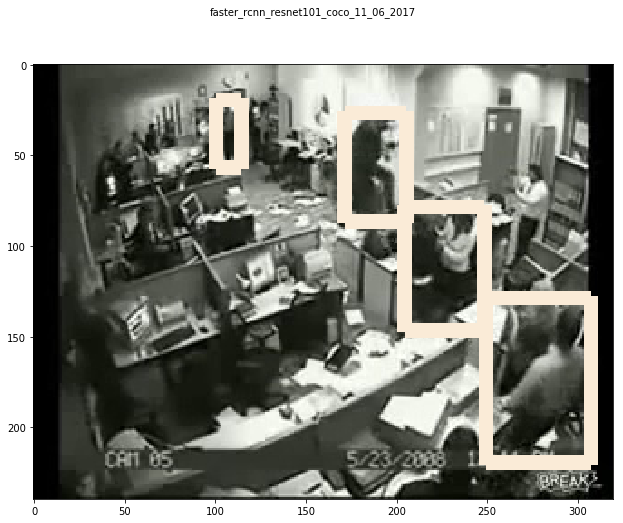

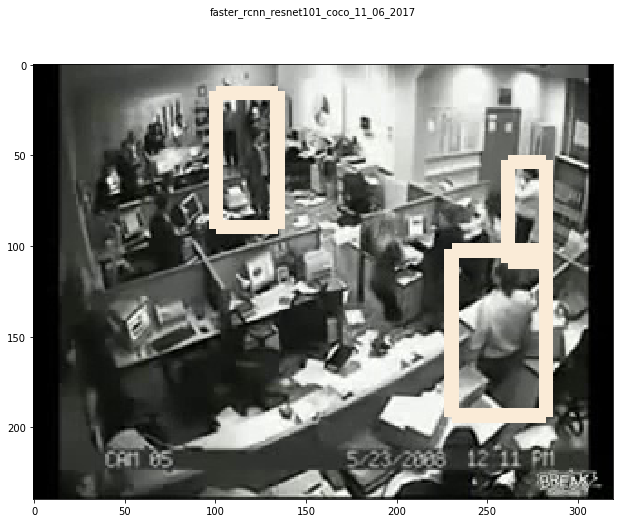

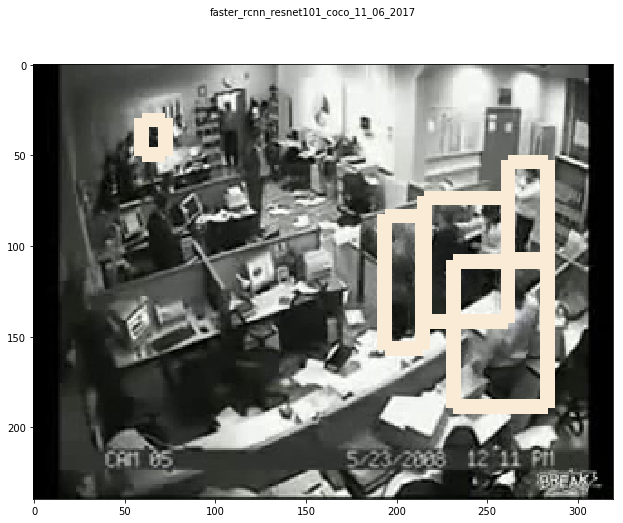

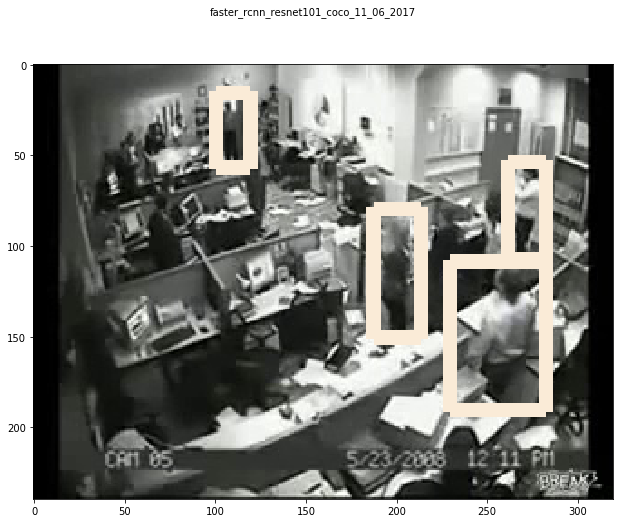

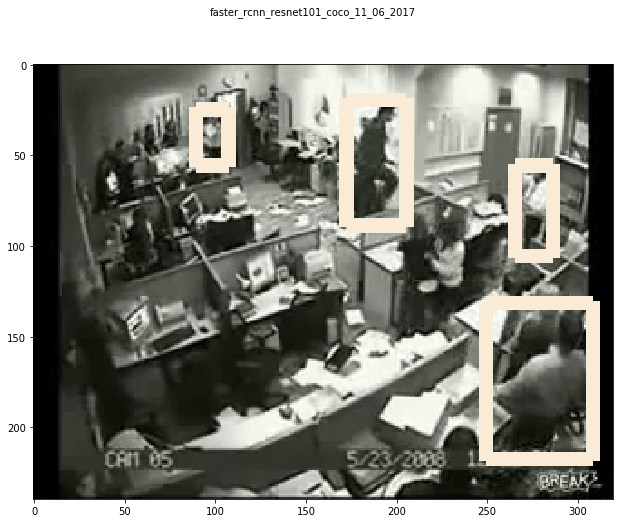

...

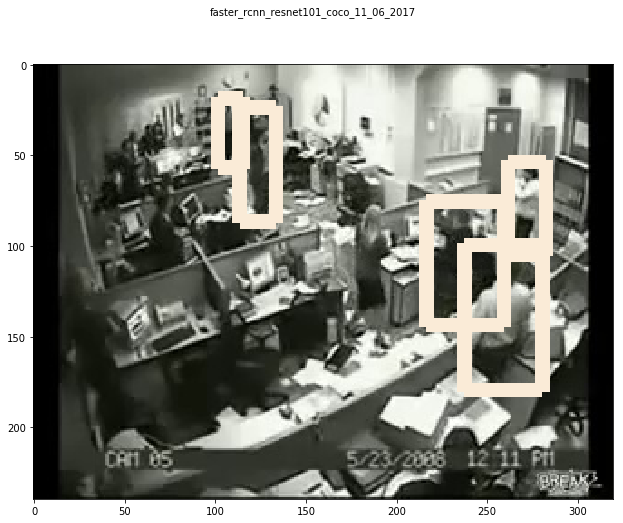

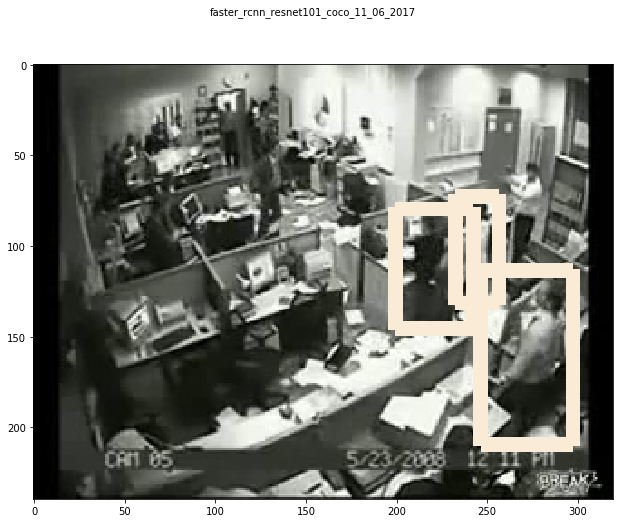

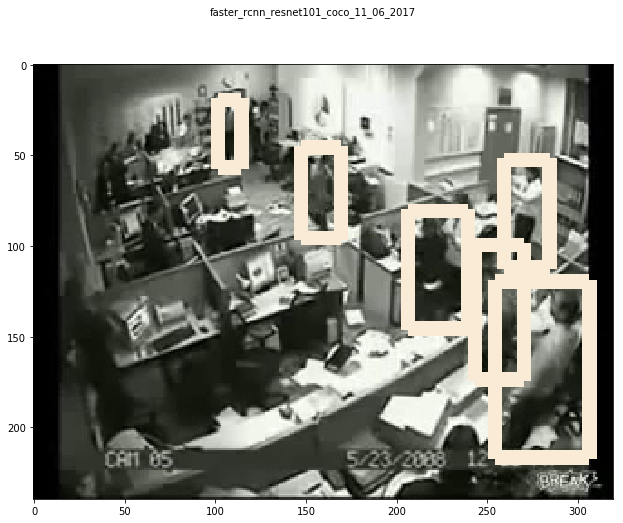

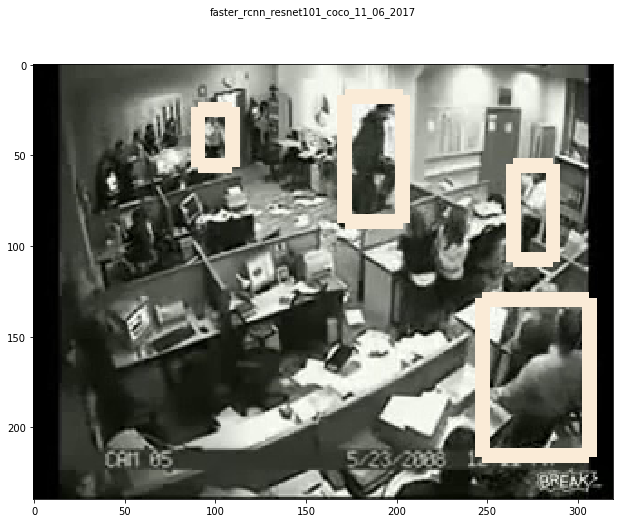

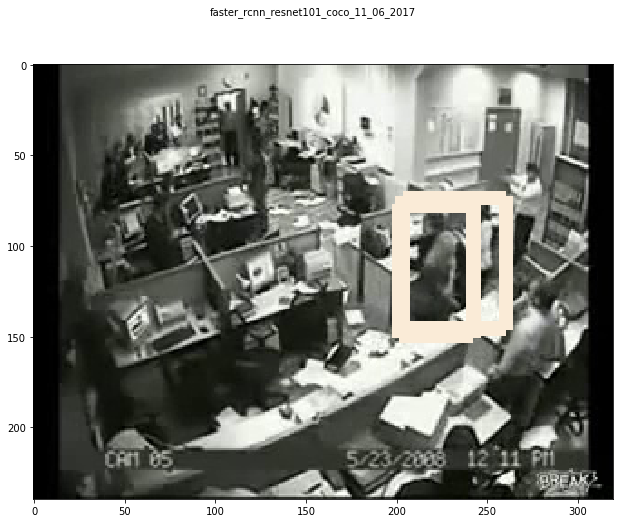

In [11]:
count = 0
for model in frozen_model_paths:
    detection_graph,image_tensor,detection_boxes,detection_scores,detection_classes = load_graph(model)
    for test_image in sim_image_paths:
#         tf_image = tf.image.decode_jpeg(tf.read_file(test_image), channels=1)
        
        image = Image.open(test_image)
        cv_image = cv2.imread(test_image,1)
        image_np = np.expand_dims(np.asarray(image, dtype=np.uint8), 0)
        boxes,scores,classes,_ = detect(detection_graph,
                                      image_tensor,
                                      detection_boxes,
                                      detection_scores,
                                      detection_classes,
                                      image_np,
                                      person_class_id)

#         print('Before',classes)
#         print('Class: ',np.count_nonzero(classes == 1))
#         print()
        
        
       
        confidence_cutoff = 0.5
        person_class_id=1
        # Filter boxes with a confidence score less than `confidence_cutoff`
        boxes, scores, classes = filter_boxes(confidence_cutoff, boxes, scores, classes,[person_class_id])
        ilustrate_detection(image,boxes,classes,model.split('/')[1])
        
#         print('After',classes)
#         print('Class : ',np.count_nonzero(classes == 1))
#         print()
        
        if (np.count_nonzero(classes == 1) >= 1):
            try:
                if not os.path.exists('Person_Frames'):
                    os.makedirs('Person_Frames')
            except OSError:
                print('Error: Creating directory of data')
                
            cv2.imwrite(os.path.join('Person_Frames', "frame{:d}.jpg".format(count)), cv_image)
            count += 1
        print("{} images are detected in {}.".format(count, 'Person_Frames'))

# SSIM - to compare similarity in frames

In [12]:
import warnings
from skimage.measure import compare_ssim
from skimage.transform import resize
from scipy.misc import imsave
from scipy.ndimage import imread
import numpy as np
import cv2
import os


warnings.filterwarnings('ignore')

# specify resized image sizes
height = 2**10
width = 2**10

In [13]:
def get_img(path, norm_size=True, norm_exposure=False):
    '''
    Prepare an image for image processing tasks
    '''
    # flatten returns a 2d grayscale array
    img = imread(path, flatten=True).astype(int)
    # resizing returns float vals 0:255; convert to ints for downstream tasks
    if norm_size:
        img = resize(img, (height, width), anti_aliasing=True, preserve_range=True)
    if norm_exposure:
        img = normalize_exposure(img)
    return img

In [14]:
def normalize_exposure(img):
    '''
    Normalize the exposure of an image.
    '''
    img = img.astype(int)
    hist = get_histogram(img)
    # get the sum of vals accumulated by each position in hist
    cdf = np.array([sum(hist[:i + 1]) for i in range(len(hist))])
    # determine the normalization values for each unit of the cdf
    sk = np.uint8(255 * cdf)
    # normalize each position in the output image
    height, width = img.shape
    normalized = np.zeros_like(img)
    for i in range(0, height):
        for j in range(0, width):
            normalized[i, j] = sk[img[i, j]]
    return normalized.astype(int)

In [15]:
def structural_sim(path_a, path_b):

    img_a = get_img(path_a)
    img_b = get_img(path_b)
    sim, diff = compare_ssim(img_a, img_b, full=True)
    return sim

In [16]:
if __name__ == '__main__':

    try:
        if not os.path.exists('Unlike_Frames'):
            os.makedirs('Unlike_Frames')
    except OSError:
        print('Error: Creating directory of data')

    noi = len(os.listdir('/home/deepak/Desktop/P1/Person_Frames'))

    print('Number of images: ', noi)

    step = 10

    k = 0  # to get frame name continous

    for i in range(0, noi, step):
        img_a = '/home/deepak/Desktop/P1/Person_Frames/frame{:d}.jpg'.format(i)
        cv_img_a = cv2.imread(img_a, 1)
        cv2.imwrite(os.path.join('Unlike_Frames', "frame{:d}.jpg".format(k)), cv_img_a)
        k = k + 1

        for j in range(i + 1, i + step):
            if j < noi:
                img_b = '/home/deepak/Desktop/P1/Person_Frames/frame{:d}.jpg'.format(j)
                cv_img_b = cv2.imread(img_b, 1)

                try:
                    structural_sim1 = structural_sim(img_a, img_b)
                    print('structural_sim: ', structural_sim1)

                except:
                    print("All frames in this step are processed")

                if structural_sim1 < 0.3:
                    cv2.imwrite(os.path.join('Unlike_Frames', "frame{:d}.jpg".format(k)), cv_img_b)
                    k = k + 1


Number of images:  123
structural_sim:  0.5481708892101961
structural_sim:  0.5542202405790869
structural_sim:  0.5519157264196897
structural_sim:  0.7986998172092761
structural_sim:  0.5693545073235732
structural_sim:  0.5582111639894606
structural_sim:  0.7742520088309647
structural_sim:  0.8215935156682004
structural_sim:  0.539142906978619
structural_sim:  0.6913054792366262
structural_sim:  0.9574910665548063
structural_sim:  0.9311650686032952
structural_sim:  0.6032115278217516
structural_sim:  0.8767331677750381
structural_sim:  0.6114903170244601
structural_sim:  0.8786385973630241
structural_sim:  0.5585186569077643
structural_sim:  0.6317490964761591
structural_sim:  0.5331046485174366
structural_sim:  0.8185112338437124
structural_sim:  0.5377492206100785
structural_sim:  0.6545825706690007
structural_sim:  0.647813002026412
structural_sim:  0.6668144406334636
structural_sim:  0.6459826072727004
structural_sim:  0.5476004311190172
structural_sim:  0.6700487047280239
structu

# Encryption & Decryption

In [17]:
from Crypto.Cipher import AES
from Crypto import Random
import os

# Key Generation
key = Random.new().read(AES.block_size)
iv = Random.new().read(AES.block_size)

In [18]:
# Encryption
try:
    if not os.path.exists('Encrypted_Frames'):
        os.makedirs('Encrypted_Frames')
        
except OSError:
    print('Error: Creating directory of data')

noi_ = len(os.listdir('/home/deepak/Desktop/P1/Unlike_Frames/'))
print('Number of frames in Unlike_Frames directory: ', noi_)

for i in range(noi_):
    img = '/home/deepak/Desktop/P1/Unlike_Frames/frame{:d}.jpg'.format(i)

    with open(img, "rb") as input_file:
        input_data = input_file.read()

    cfb_cipher = AES.new(key, AES.MODE_CFB, iv)
    enc_data = cfb_cipher.encrypt(input_data)

    path_to_enc = '/home/deepak/Desktop/P1/Encrypted_Frames/enc_frame{:d}.jpg'.format(i)

    with open(path_to_enc, "wb") as enc_file:
        enc_file.write(enc_data)

Number of frames in Unlike_Frames directory:  13


In [20]:
# Decryption
try:
    if not os.path.exists('Decrypted_Frames'):
        os.makedirs('Decrypted_Frames')
except OSError:
    print('Error: Creating directory of data')

for i in range(noi_):
    en_img = '/home/deepak/Desktop/P1/Encrypted_Frames/enc_frame{:d}.jpg'.format(i)

    with open(en_img, "rb") as enc_file2:
        enc_data2 = enc_file2.read()

    cfb_decipher = AES.new(key, AES.MODE_CFB, iv)
    plain_data = cfb_decipher.decrypt(enc_data2)

    path_to_dec = '/home/deepak/Desktop/P1/Decrypted_Frames/dec_frame{:d}.jpg'.format(i)

    with open(path_to_dec, "wb") as output_file:
        output_file.write(plain_data)

# Summary video of frames having person in them

In [22]:
import os
def save():
    os.system("ffmpeg -r 15 -i /home/deepak/Desktop/P1/Decrypted_Frames/dec_frame%01d.jpg -vcodec mpeg4 -y summary_video.mp4")

save()